**Initial data wrangling and EDA of Music Genre auto-classification project**

*Run on Google Colabratory VM*

# Imports, etc.

In [1]:
#   In case of GPU need:
# !pip install tensorflow-gpu
# import tensorflow as tf
# print(tf.__version__)
# print(tf.config.list_physical_devices('GPU'))
# print(tf.test.gpu_device_name())

In [2]:
import librosa as lr
from librosa.display import waveplot, specshow
from librosa.core.spectrum import amplitude_to_db
from librosa.feature import melspectrogram

from glob import glob

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import IPython.display as ipd

print(lr.__version__)

0.8.1


# Accessing data in Google Drive:

In [3]:
!ls '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples'

blues  classical  country  disco  hiphop  jazz	metal  pop  reggae  rock


In [4]:
bluesPath = '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/blues/*.wav'
classicalPath = '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/classical/*.wav'
countryPath = '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/country/*.wav'
discoPath = '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/disco/*.wav'
hiphopPath = '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/hiphop/*.wav'
jazzPath = '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/jazz/*.wav'
metalPath = '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/metal/*.wav'
popPath = '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/pop/*.wav'
reggaePath = '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/reggae/*.wav'
rockPath = '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/rock/*.wav'

bluesFiles = glob(bluesPath) # build list of all .wav files in folder
classicalFiles = glob(classicalPath)
countryFiles = glob(countryPath)
discoFiles = glob(discoPath)
hiphopFiles = glob(hiphopPath)
jazzFiles = glob(jazzPath)
metalFiles = glob(metalPath)
popFiles = glob(popPath)
reggaeFiles = glob(reggaePath)
rockFiles = glob(rockPath)

# Initial insights / checks:

In [5]:
print(bluesFiles[:5])
print(len(bluesFiles))

['/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/blues/blues.00002.wav', '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/blues/blues.00021.wav', '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/blues/blues.00005.wav', '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/blues/blues.00014.wav', '/content/drive/MyDrive/Springboard/FinalCapstone_LabeledSongSamples/blues/blues.00015.wav']
100


In [6]:
audio, sfreq = lr.load(bluesFiles[1]) # blues.00021.wav produces a more interesting spectrogram than .00002.wav
print(sfreq)

22050


In [7]:
lr.get_samplerate(bluesFiles[1]) # Looks correct

22050

In [8]:
len(audio)

661794

In [9]:
lr.get_duration(audio) # Gets duration in seconds

30.013333333333332

In [10]:
time = np.arange(0, len(audio)) / sfreq

In [11]:
time.shape

(661794,)

# Handy visualization functions:

In [12]:
# Some functions to produce visuals of specified file in song .wav file lists

def mel_spec(files, num):
  file = files[num - 1]
  audio, sr = lr.load(file)
  time = np.arange(0, len(audio)) / sr
  audio_melspec = melspectrogram(audio, sr=sr)
  melspec_db = amplitude_to_db(np.abs(audio_melspec))
  plt.title(file + '\nMEL SPECTROGRAM:')
  specshow(melspec_db, sr=sr, x_axis='time', y_axis='mel', cmap='magma');

def wave_view(files, num):
  file = files[num - 1]
  a, s = lr.load(file)
  plt.title(file + '\nWAVEPLOT:')
  waveplot(a);

def listen_to(files, num):
  return ipd.Audio(files[num - 1], embed=True)

# Blues Song Example and visualization walkthrough:

The following is a general overview of how one could extract mel spectrograms from the individual .wav files for use with a CNN.

The GTZAN dataset contains pre-generated mel spectrograms (as .PNG files) for each song, which are used in the following notebooks.

In [13]:
# If you want to hear what we're seeing:
ipd.Audio(bluesFiles[1], embed=True)

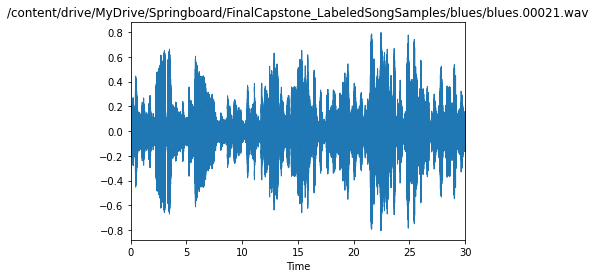

In [14]:
plt.title(bluesFiles[1])
waveplot(audio);

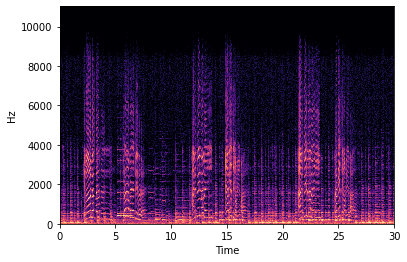

In [15]:
# From the librosa Documentation: "The default value, n_fft=2048 samples, corresponds to a physical duration of
# 93 milliseconds at a sample rate of 22050 Hz, i.e. the default sample rate in librosa."

audio_spec = lr.stft(audio)
spec_db = amplitude_to_db(np.abs(audio_spec))
specshow(spec_db, sr=sfreq, x_axis='time', y_axis='hz', cmap='magma');

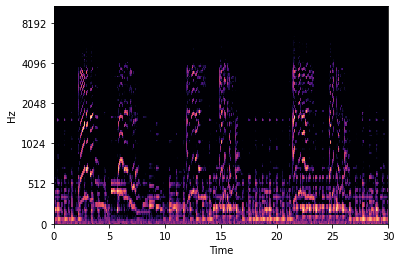

In [16]:
audio_melspec = lr.feature.melspectrogram(audio, sr=sfreq)
melspec_db = amplitude_to_db(np.abs(audio_melspec))
specshow(melspec_db, sr=sfreq, x_axis='time', y_axis='mel', cmap='magma');

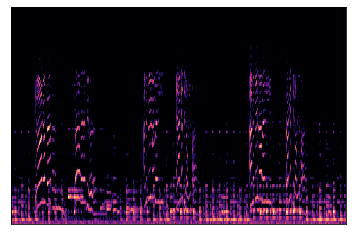

In [17]:
saveable_mel_spec = specshow(melspec_db, sr=sfreq, cmap='magma');

# Classical Song Example:

In [18]:
listen_to(classicalFiles, 1)

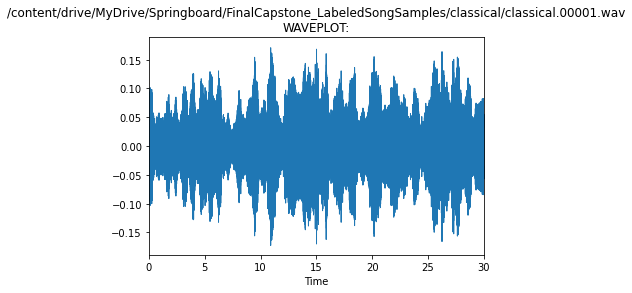

In [19]:
wave_view(classicalFiles, 1)

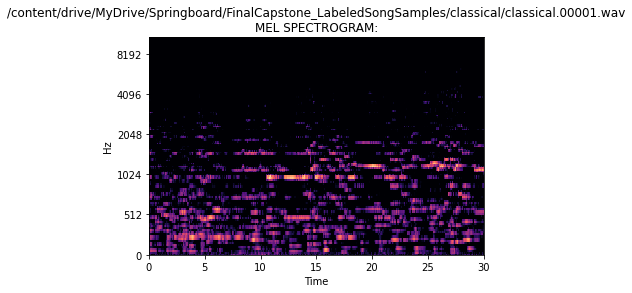

In [20]:
mel_spec(classicalFiles, 1)

# Country Song Example:

In [21]:
listen_to(countryFiles, 1)

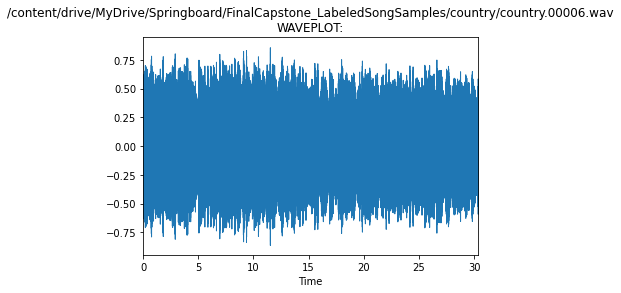

In [22]:
wave_view(countryFiles, 1)

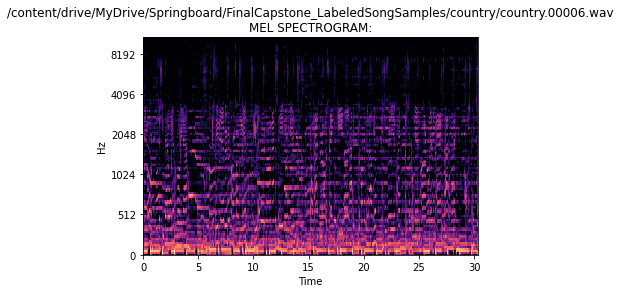

In [23]:
mel_spec(countryFiles, 1)

# Disco Song Example:

In [24]:
listen_to(discoFiles, 1)

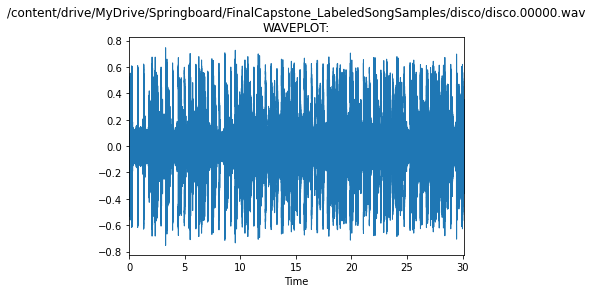

In [25]:
wave_view(discoFiles, 1)

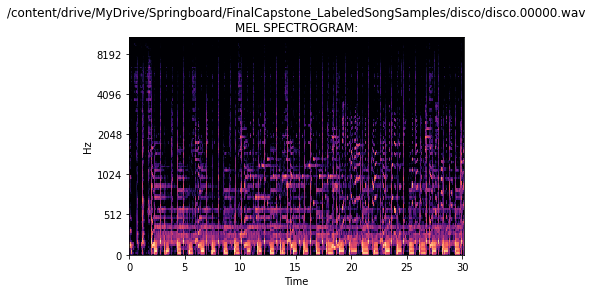

In [26]:
mel_spec(discoFiles, 1)

# HipHop Song Example:

In [27]:
listen_to(hiphopFiles, 3) # Third song selected due to clipping issue with ipd.Audio with first two hiphop tracks

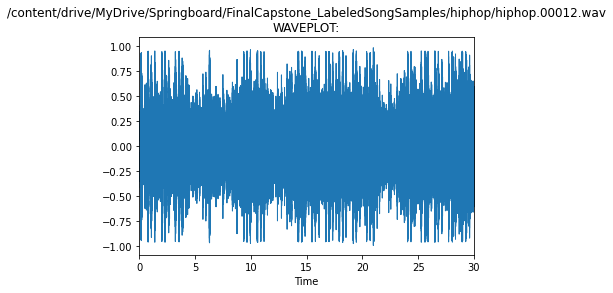

In [28]:
wave_view(hiphopFiles, 3)

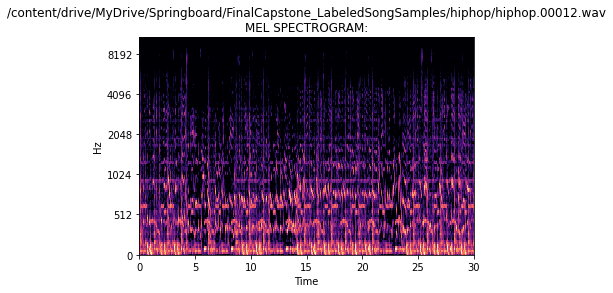

In [29]:
mel_spec(hiphopFiles, 3)

# Jazz Song Example:

In [30]:
listen_to(jazzFiles, 1)

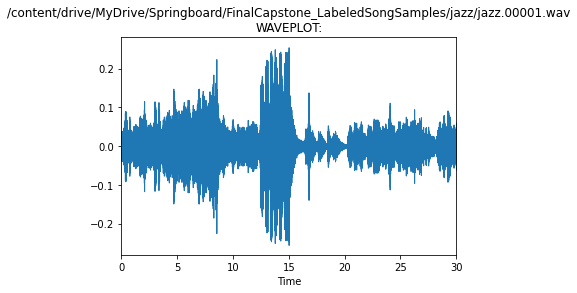

In [31]:
wave_view(jazzFiles, 1)

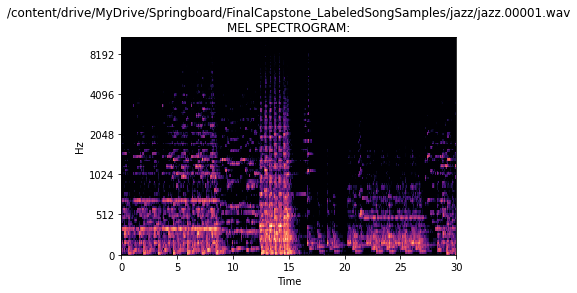

In [32]:
mel_spec(jazzFiles, 1)

# Metal Song Example:

In [33]:
listen_to(metalFiles, 1)

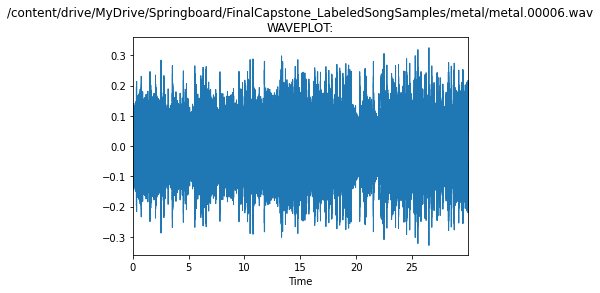

In [34]:
wave_view(metalFiles, 1)

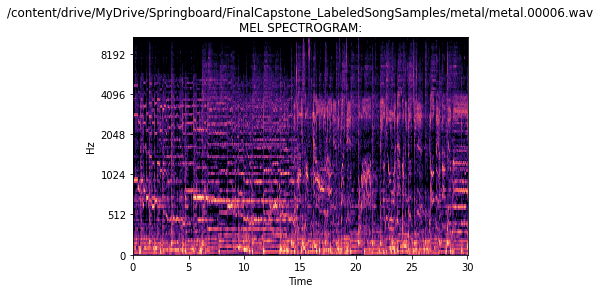

In [35]:
mel_spec(metalFiles, 1)

# Pop Song Example:

In [36]:
listen_to(popFiles, 1)

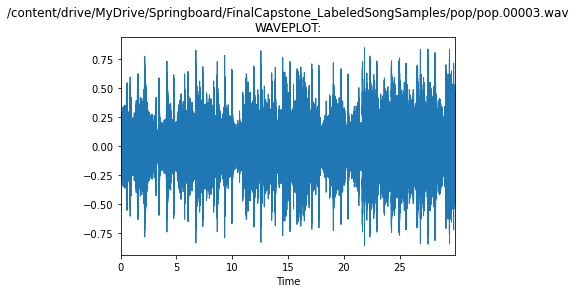

In [37]:
wave_view(popFiles, 1)

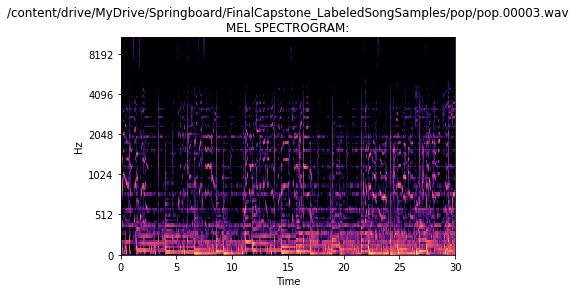

In [38]:
mel_spec(popFiles, 1)

# Reggae Song Example:

In [39]:
listen_to(reggaeFiles, 1)

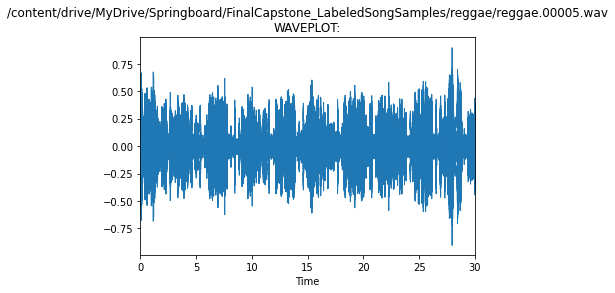

In [40]:
wave_view(reggaeFiles, 1)

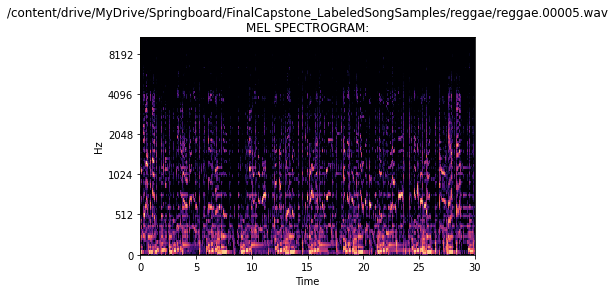

In [41]:
mel_spec(reggaeFiles, 1)

# Rock Song Example:

In [42]:
listen_to(rockFiles, 1)

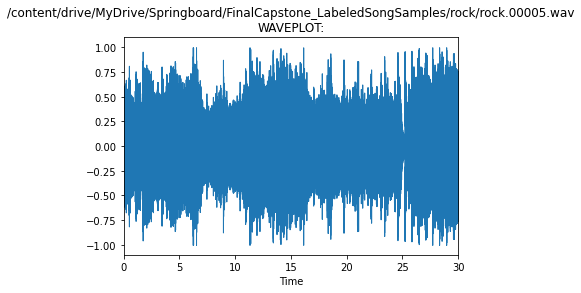

In [43]:
wave_view(rockFiles, 1)

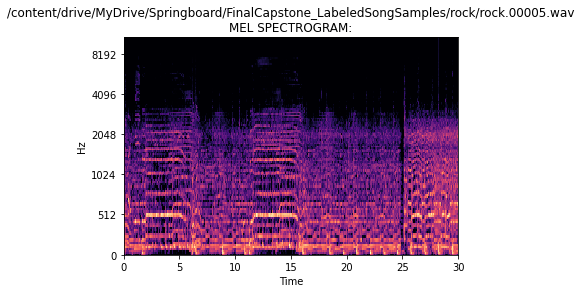

In [44]:
mel_spec(rockFiles, 1)